# Load Data 

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

import matplotlib.pyplot as plt
import seaborn as sns


def check_preds(y_valid, preds):
    # Если accuracy ≥ 94%, делаем предсказание на test.csv
    if accuracy_score(y_valid, preds) >= 0.91:
        print("Ура! Мложно отправлять решение")
        # test_preds = model.predict(test)
        # pd.DataFrame({"prediction": test_preds}).to_csv("answers.csv", index=False)
    else:
        print("Нужно улучшить модель!")


# Загрузка данных
train_data = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")


# Разделение на признаки и целевую переменную
X = train_data.drop(
    columns=["target"]
)  # предполагаем, что целевая переменная называется 'target'
y = train_data["target"]

# Разделение на train/valid
X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [2]:
X_train

,area,perimeter,major_axis,minor_axis,eccentricity,eqdiasq,solidity,convex_area,extent,aspect_ratio,roundness,compactness,shapefactor_1,shapefactor_2,shapefactor_3,shapefactor_4
634,90931,1124.2371,418.7390,277.8192,0.7482,340.2601,0.9933,91545,0.7387,1.5072,0.9041,0.8126,0.0046,0.0031,0.6603,0.9952
673,75725,1163.8350,391.0428,253.5031,0.7614,310.5094,0.9562,79194,0.7097,1.5426,0.7025,0.7941,0.0052,0.0033,0.6305,0.9726
823,83004,1997.5260,463.2641,255.4738,0.8342,325.0907,0.8959,92649,0.6283,1.8134,0.2614,0.7017,0.0056,0.0031,0.4924,0.8930
1150,92868,1163.1219,435.7098,273.1259,0.7791,343.8651,0.9920,93616,0.7304,1.5953,0.8626,0.7892,0.0047,0.0029,0.6228,0.9936
135,96045,1219.2560,490.9517,249.5563,0.8612,349.6974,0.9919,96827,0.7379,1.9673,0.8119,0.7123,0.0051,0.0026,0.5073,0.9981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,74642,1260.9821,446.3433,217.8760,0.8728,308.2809,0.9575,77954,0.7183,2.0486,0.5899,0.6907,0.0060,0.0029,0.4770,0.9773
1095,79408,2382.7271,467.5201,258.8673,0.8327,317.9708,0.8612,92208,0.6831,1.8060,0.1758,0.6801,0.0059,0.0033,0.4626,0.8354
1130,65035,1029.5341,417.8440,200.7485,0.8770,287.7588,0.9828,66176,0.7814,2.0814,0.7710,0.6887,0.0064,0.0031,0.4743,0.9872
860,76115,1104.8020,419.1025,246.6200,0.8085,311.3079,0.9333,81552,0.6787,1.6994,0.7836,0.7428,0.0055,0.0032,0.5517,0.9376


## Simple Radnom Forest

In [3]:
# Обучение модели
model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
model.fit(X_train, y_train)

# Проверка accuracy
preds = model.predict(X_valid)
print(f"Accuracy: {accuracy_score(y_valid, preds):.2%}")
check_preds(y_valid=y_valid, preds=preds)

Accuracy: 85.27%
Нужно улучшить модель!


In [4]:
# Выведем размеры данных
print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_valid shape: {X_valid.shape}, y_valid shape: {y_valid.shape}")

X_train shape: (1030, 16), y_train shape: (1030,)
X_valid shape: (258, 16), y_valid shape: (258,)


# EDA

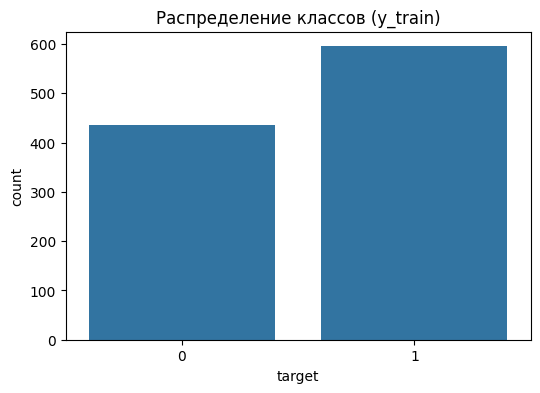

Соотношение классов:
target
1    57.76699
0    42.23301
Name: proportion, dtype: float64


In [5]:
# Распределение классов в обучающей выборке
plt.figure(figsize=(6, 4))
sns.countplot(x=y_train)
plt.title("Распределение классов (y_train)")
plt.show()

# Процентное соотношение
class_ratio = y_train.value_counts(normalize=True) * 100
print(f"Соотношение классов:\n{class_ratio}")

In [6]:
df_train_X = pd.DataFrame(X_train)
df_train_X.describe()

,area,perimeter,major_axis,minor_axis,eccentricity,eqdiasq,solidity,convex_area,extent,aspect_ratio,roundness,compactness,shapefactor_1,shapefactor_2,shapefactor_3,shapefactor_4
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,80228.143689,1417.135322,447.089116,238.717690,0.840196,318.543210,0.940714,85284.973786,0.715835,1.897432,0.574623,0.713241,0.005681,0.003008,0.510588,0.955687
std,12859.508363,369.000842,32.356604,29.897021,0.049248,26.086943,0.048376,13018.300563,0.052020,0.235207,0.208071,0.043329,0.000735,0.000331,0.062565,0.050496
min,37570.000000,858.363000,321.425500,143.174100,0.504900,218.713500,0.680200,41290.000000,0.500300,1.158500,0.128800,0.591800,0.004000,0.002400,0.350200,0.641400
25%,71951.500000,1169.900525,427.545175,217.794950,0.817800,302.673875,0.922225,76640.250000,0.687925,1.737550,0.400125,0.680625,0.005100,0.002800,0.463225,0.945125
50%,79823.500000,1261.215050,450.041150,236.185750,0.850650,318.801550,0.953400,85054.000000,0.725050,1.902000,0.648000,0.708950,0.005600,0.002900,0.502650,0.972700
75%,89594.000000,1581.687000,468.616200,257.671175,0.875675,337.749375,0.975900,93825.250000,0.753200,2.070725,0.742350,0.742375,0.006100,0.003100,0.551175,0.986600
max,124008.000000,2755.049100,535.642200,383.046100,0.933000,397.356100,0.994800,132478.000000,0.820400,2.779400,0.904100,0.869500,0.009200,0.005200,0.756100,0.998700


In [7]:
pd.DataFrame(
    df_train_X.isna().any(),
)

,0
area,False
perimeter,False
major_axis,False
minor_axis,False
eccentricity,False
eqdiasq,False
solidity,False
convex_area,False
extent,False
aspect_ratio,False


In [8]:
df_train_X.columns

Index(['area', 'perimeter', 'major_axis', 'minor_axis', 'eccentricity',
       'eqdiasq', 'solidity', 'convex_area', 'extent', 'aspect_ratio',
       'roundness', 'compactness', 'shapefactor_1', 'shapefactor_2',
       'shapefactor_3', 'shapefactor_4'],
      dtype='object')

## Deep Seek Analysis 

Эти признаки описывают **геометрические и морфологические характеристики объектов** (в данном случае, вероятно, дронов или их проекций на изображении). Давайте разберём их по группам:

---

### **1. Основные геометрические параметры**
| Признак           | Описание | Возможная интерпретация |
|-------------------|----------|-------------------------|
| `area`           | Площадь объекта (в пикселях или условных единицах) | Размер дрона. |
| `perimeter`      | Периметр (длина границы объекта) | Чем больше, тем сложнее форма. |
| `major_axis`     | Длина главной оси (максимальный размер) | Вытянутость объекта. |
| `minor_axis`     | Длина малой оси (перпендикулярна главной) | |
| `convex_area`    | Площадь выпуклой оболочки объекта | Если сильно отличается от `area`, форма вогнутая. |

---

### **2. Форма и компактность**
| Признак           | Описание | Формула (если есть) |
|-------------------|----------|---------------------|
| `eccentricity`   | Эксцентриситет (вытянутость) | Отношение фокусного расстояния эллипса к его большой оси. `0` = круг, `1` = линия. |
| `aspect_ratio`   | Отношение осей (`major_axis / minor_axis`) | Чем больше, тем более вытянут объект. |
| `roundness`      | Округлость | Зависит от соотношения площади и периметра. Близко к `1` для идеального круга. |
| `compactness`   | Компактность | `(perimeter^2) / (4π * area)`. Минимум `1` для круга. |
| `solidity`      | Отношение площади объекта к площади его выпуклой оболочки (`area / convex_area`) | Меньше `1` если есть вогнутости. |

---

### **3. Дополнительные shape-факторы**
Эти признаки часто используются в компьютерном зрении для описания сложных форм:
- `shapefactor_1`, `shapefactor_2`, ... — Вероятно, кастомные метрики формы, например:
  - Отношения моментов инерции.
  - Коэффициенты Фурье контура.
  - Стандартизированные параметры эллипса.

---

### **4. Прочие параметры**
| Признак       | Описание |
|--------------|----------|
| `eqdiasq`    | Эквивалентный диаметр (диаметр круга с той же площадью, что и объект). |
| `extent`     | Отношение площади объекта к площади ограничивающего прямоугольника (`area / (width * height)`). |

---

### **Как это может относиться к дронам?**
1. **Враждебные дроны** могут иметь:
   - Более вытянутую форму (`high eccentricity`, `high aspect_ratio`).
   - Менее округлые контуры (`low roundness`, `high compactness`).
   - Сложную форму с вогнутостями (`low solidity`).

2. **Дружественные дроны**:
   - Ближе к кругу (`roundness ≈ 1`, `eccentricity ≈ 0`).
   - Более гладкие контуры (`high solidity`).

---

### **Рекомендации для EDA**
1. **Визуализация распределений**:
   ```python
   sns.pairplot(X_train[['area', 'eccentricity', 'solidity', 'roundness', 'aspect_ratio']], hue=y_train)
   ```
   - Ищите признаки, где распределения для классов `0` и `1` сильно отличаются.

2. **Проверка корреляции с целевой переменной**:
   ```python
   X_train.corrwith(y_train).abs().sort_values(ascending=False)
   ```

3. **Анализ выбросов**:
   - Например, дрон с `area = 1000` и `perimeter = 10` — явный артефакт (ошибка данных).

---

### **Пример вывода**
Если `eccentricity` и `aspect_ratio` сильно коррелируют с `target`, значит, **вражеские дроны более вытянутые**.  
Если `solidity` ниже для класса `1`, их форма **сложнее (есть "ушки", "пропеллеры")**.

Хотите глубже разобрать какой-то конкретный признак? 🛸

In [ ]:
# Тепловая карта корреляции
plt.figure(figsize=(12, 8))
corr_matrix = X_train.corr()
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Корреляция признаков")
plt.show()

# Проверим корреляцию с целевой переменной (если она числовая)
if pd.api.types.is_numeric_dtype(y_train):
    X_train_with_target = X_train.copy()
    X_train_with_target["target"] = y_train
    plt.figure(figsize=(10, 6))
    sns.heatmap(
        X_train_with_target.corr()[["target"]].sort_values("target", ascending=False),
        annot=True,
        cmap="coolwarm",
    )
    plt.title("Корреляция признаков с целевой переменной")
    plt.show()

In [9]:
X_train.columns

Index(['area', 'perimeter', 'major_axis', 'minor_axis', 'eccentricity',
       'eqdiasq', 'solidity', 'convex_area', 'extent', 'aspect_ratio',
       'roundness', 'compactness', 'shapefactor_1', 'shapefactor_2',
       'shapefactor_3', 'shapefactor_4'],
      dtype='object')

### Pairs plots

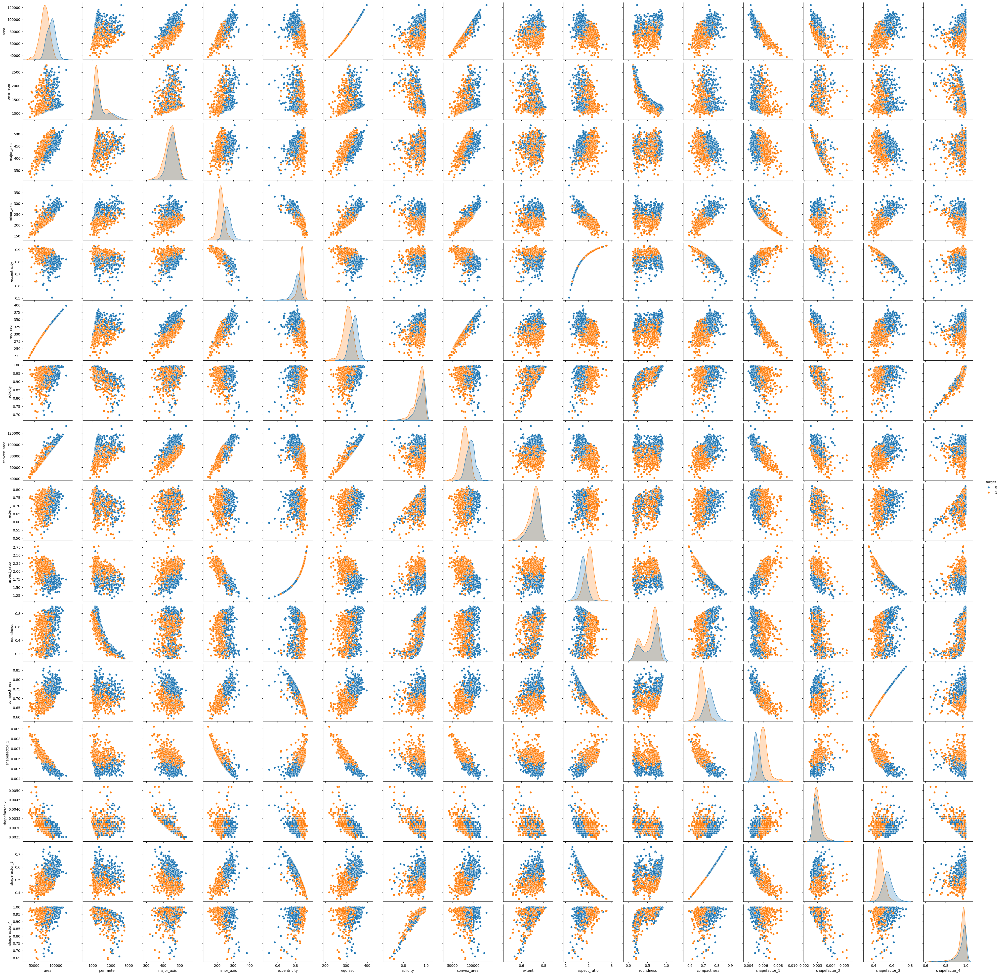

In [10]:
import seaborn as sns
import pandas as pd

# если X_train — DataFrame, а y_train — Series
df = X_train.copy()
df["target"] = y_train.values

sns.pairplot(
    data=df,
    vars=[
        "area",
        "perimeter",
        "major_axis",
        "minor_axis",
        "eccentricity",
        "eqdiasq",
        "solidity",
        "convex_area",
        "extent",
        "aspect_ratio",
        "roundness",
        "compactness",
        "shapefactor_1",
        "shapefactor_2",
        "shapefactor_3",
        "shapefactor_4",
    ],
    hue="target",
)

In [11]:
y_train.values

array([0, 0, 0, ..., 1, 0, 1], shape=(1030,))

In [12]:
X_train[["area", "eccentricity", "solidity", "roundness", "aspect_ratio"]]

,area,eccentricity,solidity,roundness,aspect_ratio
634,90931,0.7482,0.9933,0.9041,1.5072
673,75725,0.7614,0.9562,0.7025,1.5426
823,83004,0.8342,0.8959,0.2614,1.8134
1150,92868,0.7791,0.9920,0.8626,1.5953
135,96045,0.8612,0.9919,0.8119,1.9673
...,...,...,...,...,...
1044,74642,0.8728,0.9575,0.5899,2.0486
1095,79408,0.8327,0.8612,0.1758,1.8060
1130,65035,0.8770,0.9828,0.7710,2.0814
860,76115,0.8085,0.9333,0.7836,1.6994


Index(['area', 'perimeter', 'major_axis', 'minor_axis', 'eccentricity',
       'eqdiasq', 'solidity', 'convex_area', 'extent', 'aspect_ratio',
       'roundness', 'compactness', 'shapefactor_1', 'shapefactor_2',
       'shapefactor_3', 'shapefactor_4', 'target'],
      dtype='object')


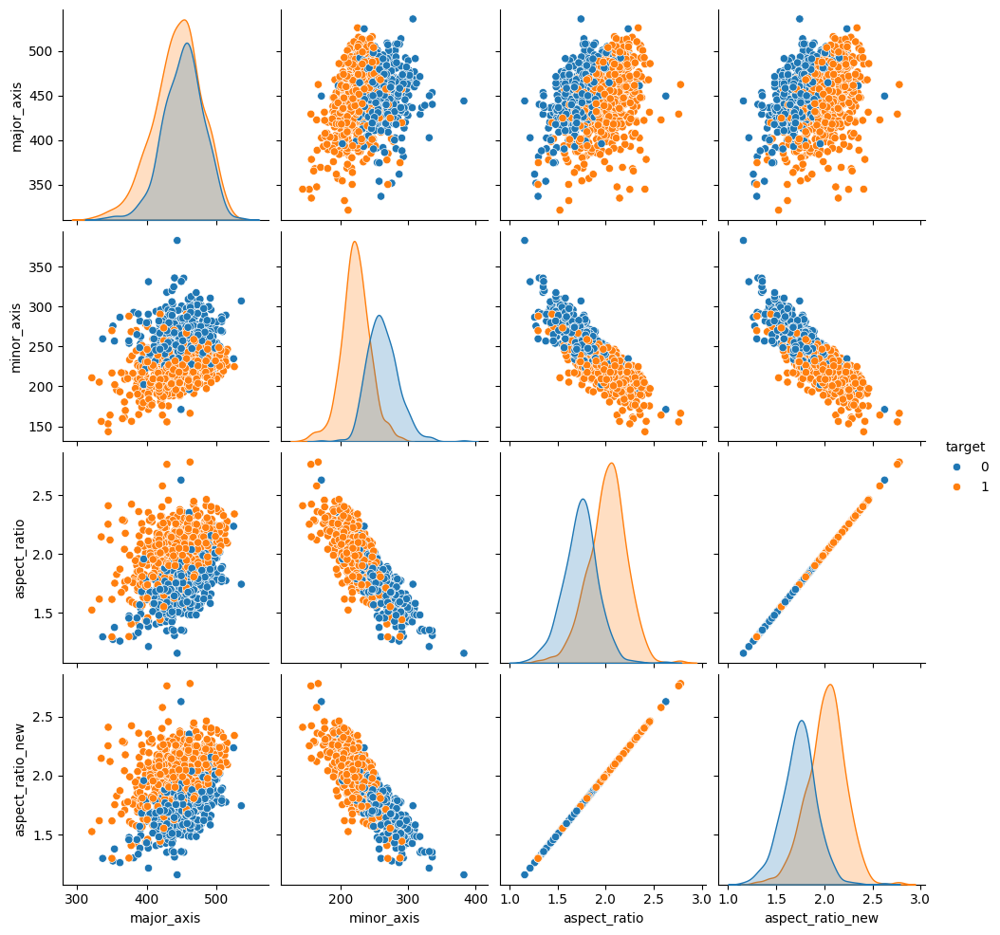

In [13]:
df = X_train.copy()
df["target"] = y_train.values
print(df.columns)
# найдем отношение major_axis, minor_axis и сравним с aspect_ratio

df["aspect_ratio_new"] = df["major_axis"] / df["minor_axis"]

df.columns
sns.pairplot(
    data=df,
    vars=["major_axis", "minor_axis", "aspect_ratio", "aspect_ratio_new"],
    hue="target",
)

# These ratios are the same. Aspect ratio may be deleted. Major_axis may be deleted to.

Index(['area', 'perimeter', 'major_axis', 'minor_axis', 'eccentricity',
       'eqdiasq', 'solidity', 'convex_area', 'extent', 'aspect_ratio',
       'roundness', 'compactness', 'shapefactor_1', 'shapefactor_2',
       'shapefactor_3', 'shapefactor_4', 'target'],
      dtype='object')


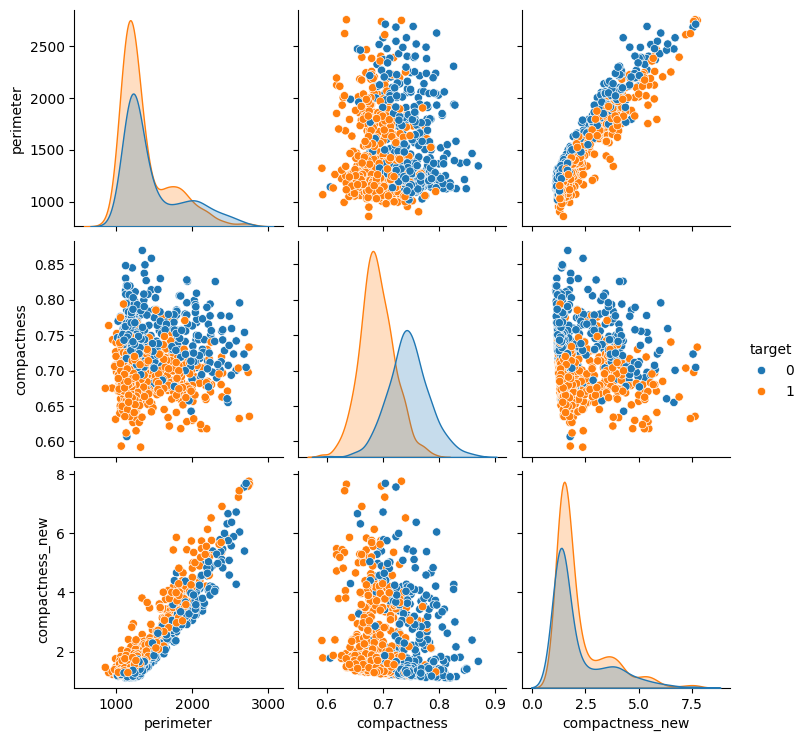

In [14]:
df = X_train.copy()
df["target"] = y_train.values
print(df.columns)
# найдем отношение major_axis, minor_axis и сравним с aspect_ratio

df["compactness_new"] = df["perimeter"] * df["perimeter"] / (4 * 3.14 * df["area"])

# df.columns
# sns.pairplot(    data=df,
#     vars=["perimeter", "compactness", "compactness_new"]
#     hue="target",
# )

df.columns
sns.pairplot(
    data=df,
    vars=["perimeter", "compactness", "compactness_new"],
    hue="target",
)

# These ratios are the same. Aspect ratio may be deleted. Major_axis may be deleted to.

In [ ]:
# Разделение на признаки и целевую переменную
X = train_data.drop(
    columns=["target"]
)  # предполагаем, что целевая переменная называется 'target'
y = train_data["target"]

# Разделение на train/valid
X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.2, random_state=42
)

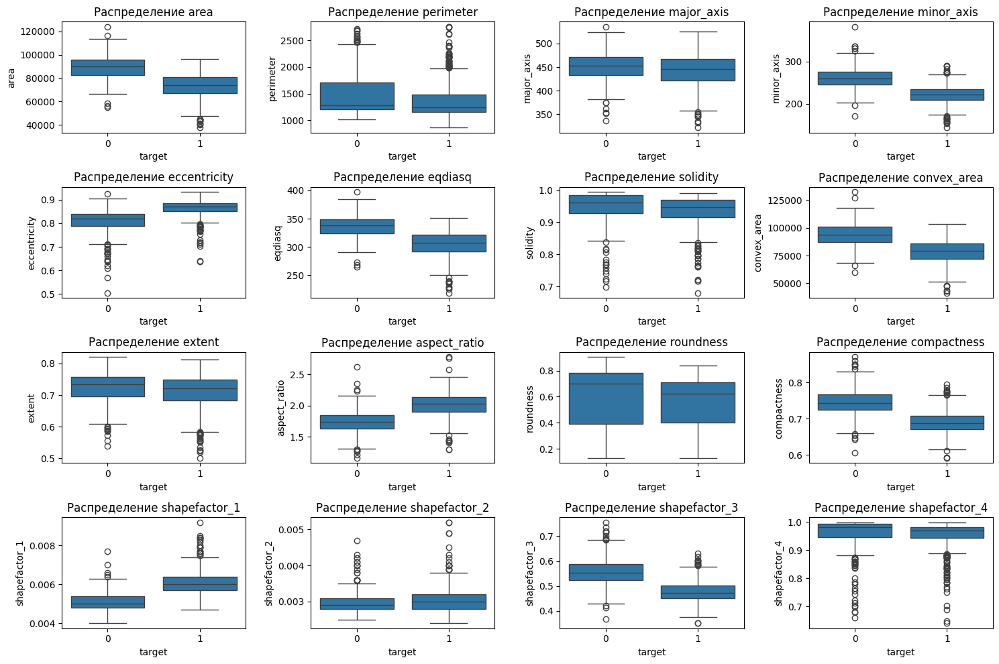

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

# Список признаков для анализа
features = [
    "area",
    "perimeter",
    "major_axis",
    "minor_axis",
    "eccentricity",
    "eqdiasq",
    "solidity",
    "convex_area",
    "extent",
    "aspect_ratio",
    "roundness",
    "compactness",
    "shapefactor_1",
    "shapefactor_2",
    "shapefactor_3",
    "shapefactor_4",
]

# Построим boxplot для каждого признака
plt.figure(figsize=(15, 10))
for i, feature in enumerate(features, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=y_train, y=X_train[feature])
    plt.title(f"Распределение {feature}")
plt.tight_layout()
plt.show()

# полезные featrue
# [ "area", "minor_axis", "eccentricity", "eqdiasq", "convex_area", "aspect_ratio", "compactness", "shapefactor_1", "shapefactor_3"]

In [17]:
# Обучение модели
model = RandomForestClassifier(n_estimators=300, max_depth=20, random_state=42)
features = [
    "area",
    "minor_axis",
    "eccentricity",
    "eqdiasq",
    "convex_area",
    "aspect_ratio",
    "compactness",
    "shapefactor_1",
    "shapefactor_3",
]
model.fit(X_train[features], y_train)

# Проверка accuracy
preds = model.predict(X_valid[features])
print(f"Accuracy: {accuracy_score(y_valid, preds):.2%}")
check_preds(y_valid=y_valid, preds=preds)

Accuracy: 85.66%
Нужно улучшить модель!


In [18]:
from sklearn.ensemble import RandomForestClassifier
import numpy as np

# Инициализация модели
model = RandomForestClassifier(n_estimators=500, max_depth=30, random_state=42)

# Обучение на всех данных (можно использовать X_train, y_train)
model.fit(X_train, y_train)

# Важность признаков (Gini importance)
importances = model.feature_importances_
features = X_train.columns

# Сортируем признаки по важности
indices = np.argsort(importances)[::-1]
features[indices[:2]].tolist()
# Выводим топ-10 признаков
print("Топ-10 важных признаков:")
for i in range(indices.shape[0]):
    print(f"{i+1}. {features[indices[i]]}: {importances[indices[i]]:.4f}")

Топ-10 важных признаков:
1. shapefactor_1: 0.1805
2. minor_axis: 0.1567
3. shapefactor_3: 0.0991
4. compactness: 0.0845
5. aspect_ratio: 0.0668
6. shapefactor_4: 0.0541
7. eccentricity: 0.0535
8. eqdiasq: 0.0519
9. area: 0.0518
10. convex_area: 0.0452
11. solidity: 0.0328
12. perimeter: 0.0291
13. extent: 0.0280
14. roundness: 0.0279
15. major_axis: 0.0268
16. shapefactor_2: 0.0115


In [19]:
# Обучение модели
for i in range(1, 16):
    model = RandomForestClassifier(n_estimators=500, max_depth=30, random_state=42)
    features_sub = features[indices[:i]].tolist()
    model.fit(X_train[features_sub], y_train)

    # Проверка accuracy
    preds = model.predict(X_valid[features_sub])
    print(i, f": Accuracy: {accuracy_score(y_valid, preds):.2%}")
    print(features_sub)
    check_preds(y_valid=y_valid, preds=preds)

1 : Accuracy: 83.72%
['shapefactor_1']
Нужно улучшить модель!
2 : Accuracy: 77.52%
['shapefactor_1', 'minor_axis']
Нужно улучшить модель!
3 : Accuracy: 81.78%
['shapefactor_1', 'minor_axis', 'shapefactor_3']
Нужно улучшить модель!
4 : Accuracy: 81.78%
['shapefactor_1', 'minor_axis', 'shapefactor_3', 'compactness']
Нужно улучшить модель!


KeyboardInterrupt: 

In [20]:
threshold = 0.01
selected_features = [features[i] for i in indices if importances[i] > threshold]

print("Отобранные признаки:", selected_features)

# Новые датасеты
model = RandomForestClassifier(n_estimators=500, max_depth=30, random_state=42)
features_sub = selected_features
model.fit(X_train[features_sub], y_train)

# Проверка accuracy
preds = model.predict(X_valid[features_sub])
print(i, f": Accuracy: {accuracy_score(y_valid, preds):.2%}")
print(features_sub)
check_preds(y_valid=y_valid, preds=preds)

Отобранные признаки: ['shapefactor_1', 'minor_axis', 'shapefactor_3', 'compactness', 'aspect_ratio', 'shapefactor_4', 'eccentricity', 'eqdiasq', 'area', 'convex_area', 'solidity', 'perimeter', 'extent', 'roundness', 'major_axis', 'shapefactor_2']
5 : Accuracy: 86.43%
['shapefactor_1', 'minor_axis', 'shapefactor_3', 'compactness', 'aspect_ratio', 'shapefactor_4', 'eccentricity', 'eqdiasq', 'area', 'convex_area', 'solidity', 'perimeter', 'extent', 'roundness', 'major_axis', 'shapefactor_2']
Нужно улучшить модель!


In [21]:
from sklearn.metrics import accuracy_score

threshold = 0.01
selected_features = [features[i] for i in indices if importances[i] > threshold]

print("Отобранные признаки:", selected_features)

# Новые датасеты
X_train_selected = X_train[selected_features]
X_valid_selected = X_valid[selected_features]

# До отбора
model_full = RandomForestClassifier(random_state=42)
model_full.fit(X_train, y_train)
pred_full = model_full.predict(X_valid)
accuracy_full = accuracy_score(y_valid, pred_full)

# После отбора
model_selected = RandomForestClassifier(random_state=42)
model_selected.fit(X_train_selected, y_train)
pred_selected = model_selected.predict(X_valid_selected)
accuracy_selected = accuracy_score(y_valid, pred_selected)

print(f"Accuracy (все признаки): {accuracy_full:.4f}")
print(f"Accuracy (отобранные признаки): {accuracy_selected:.4f}")

Отобранные признаки: ['shapefactor_1', 'minor_axis', 'shapefactor_3', 'compactness', 'aspect_ratio', 'shapefactor_4', 'eccentricity', 'eqdiasq', 'area', 'convex_area', 'solidity', 'perimeter', 'extent', 'roundness', 'major_axis', 'shapefactor_2']
Accuracy (все признаки): 0.8721
Accuracy (отобранные признаки): 0.8682


In [37]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Загрузка данных (предполагаем, что X и y уже загружены)
X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Создание Pipeline
pipeline = Pipeline(
    [
        (
            "poly",
            PolynomialFeatures(degree=2, include_bias=False),
        ),  # Добавляем признаки 2-й степени
        ("scaler", StandardScaler()),  # Стандартизация
        ("pca", PCA(n_components=10)),  # Уменьшение до 30 компонент
        (
            "clf",
            RandomForestClassifier(
                n_estimators=500, random_state=42, class_weight="balanced"
            ),
        ),  # Классификатор
    ]
)

# Обучение модели
pipeline.fit(X_train, y_train)

# Предсказание на валидационной выборках
y_pred = pipeline.predict(X_valid)
y_pred_train = pipeline.predict(X_train)
accuracy = accuracy_score(y_valid, y_pred)
accuracy_train = accuracy_score(y_train, y_pred_train)

print(f"Accuracy на train: {accuracy:.4f}")
print(f"Accuracy на валидации: {accuracy_train:.4f}")

Accuracy на train: 0.8721
Accuracy на валидации: 1.0000


In [32]:
from sklearn.model_selection import GridSearchCV

# Параметры для поиска
params = {
    "pca__n_components": [20, 30, 40],  # Варианты для PCA
    "clf__n_estimators": [50, 100, 200, 500, 700],  # Количество деревьев
    "clf__max_depth": [None, 10, 20],  # Глубина деревьев
}

# Поиск по сетке
grid = GridSearchCV(pipeline, params, cv=5, scoring="accuracy")
grid.fit(X_train, y_train)

# Лучшие параметры
print("Лучшие параметры:", grid.best_params_)
print("Лучшая accuracy:", grid.best_score_)

Лучшие параметры: {'clf__max_depth': 20, 'clf__n_estimators': 500, 'pca__n_components': 40}
Лучшая accuracy: 0.863106796116505


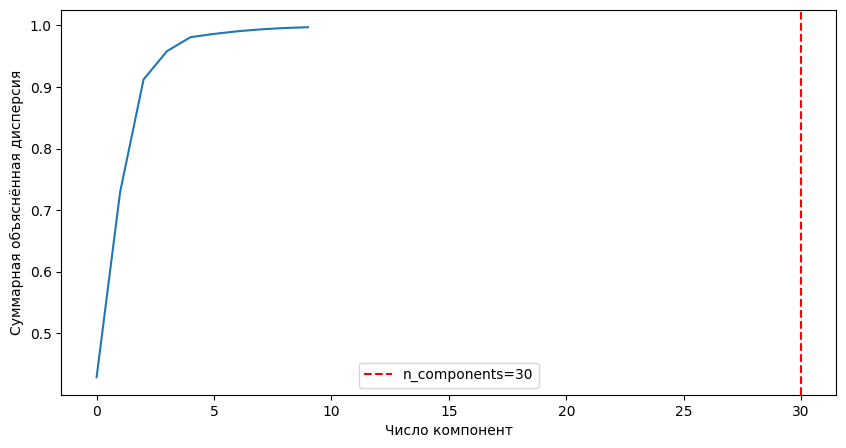

In [29]:
# Извлекаем PCA из обученного pipeline
pca = pipeline.named_steps["pca"]

# График объяснённой дисперсии
plt.figure(figsize=(10, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Число компонент")
plt.ylabel("Суммарная объяснённая дисперсия")
plt.axvline(30, color="r", linestyle="--", label="n_components=30")
plt.legend()
plt.show()

# Обучение с удалением данных, на которых модель ошибается

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Исходные данные
X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Первоначальная модель
model = RandomForestClassifier(
    random_state=42,
)
model.fit(X_train, y_train)

# Предсказание на обучающей выборке
y_train_pred = model.predict(X_train)

# Найдём индексы ошибочных предсказаний
wrong_indices = np.where(y_train_pred != y_train)[0]
print(f"Число ошибок в train: {len(wrong_indices)}")

# Предсказание на валидационной и обучающей  выборках
y_pred = pipeline.predict(X_valid)
y_pred_train = pipeline.predict(X_train)
accuracy = accuracy_score(y_valid, y_pred)
accuracy_train = accuracy_score(y_train, y_pred_train)
print("valid accuracy: ", accuracy)
print("train accuracy: ", accuracy_train)

Число ошибок в train: 1


### Random Forest GridSearch

Так у меня всего 1 неправильный элемент на train, точность почти 100%, по всей видимости модель переобучается, сделаме попробуем сделать grid search, чтобы зарегуляризировать модель? Надо добавить еще полиному 3 степени для свойств и pca и балансировку классов в RandomForest.

In [82]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold


# Создаём пайплайн
pipeline = Pipeline(
    [
        (
            "poly",
            PolynomialFeatures(degree=3, include_bias=False),
        ),  # Полином 3-й степени
        ("scaler", StandardScaler()),  # Стандартизация
        ("pca", PCA()),  # PCA без фиксированного n_components
        (
            "clf",
            RandomForestClassifier(class_weight="balanced", random_state=42),
        ),  # Балансировка классов
    ]
)

# Сетка параметров
params = {
    # "pca__n_components": [30, 35, 40, 45],  # Тестируем разное число компонент
    "pca__n_components": [35, 40, 45],  # Тестируем разное число компонент
    # "clf__n_estimators": [45, 50, 60, 200],
    "clf__n_estimators": [45, 50, 55],
    # "clf__max_depth": [5, 10, 12],  # None = без ограничения глубины
    "clf__max_depth": [10, 11, 12],  # None = без ограничения глубины
    "clf__min_samples_split": [38, 40, 42],
    # "clf__max_features": ["sqrt", "log2"],  # Количество признаков для разделения
    "clf__max_features": ["sqrt"],  # Количество признаков для разделения
    # "clf__ccp_alpha": [0, 0.01, 0.1],
    "clf__ccp_alpha": [0],
}

# Запускаем GridSearch
grid = GridSearchCV(
    pipeline,
    params,
    cv=StratifiedKFold(
        n_splits=20, shuffle=True, random_state=42
    ),  # 5-fold кросс-валидация
    scoring="accuracy",  # Метрика
    n_jobs=-1,  # Используем все ядра CPU
)
grid.fit(X_train, y_train)

# Лучшие параметры
print("Лучшие параметры:", grid.best_params_)
print("Accuracy на кросс-валидации:", grid.best_score_)

Лучшие параметры: {'clf__ccp_alpha': 0, 'clf__max_depth': 12, 'clf__max_features': 'sqrt', 'clf__min_samples_split': 42, 'clf__n_estimators': 55, 'pca__n_components': 35}
Accuracy на кросс-валидации: 0.8650641025641026


In [50]:
# from sklearn.pipeline import Pipeline
# from sklearn.preprocessing import PolynomialFeatures, StandardScaler
# from sklearn.decomposition import PCA
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.model_selection import GridSearchCV

# # Создаём пайплайн
# pipeline = Pipeline(
#     [
#         (
#             "poly",
#             PolynomialFeatures(degree=3, include_bias=False),
#         ),  # Полином 3-й степени
#         ("scaler", StandardScaler()),  # Стандартизация
#         ("pca", PCA()),  # PCA без фиксированного n_components
#         (
#             "clf",
#             RandomForestClassifier(class_weight="balanced", random_state=42),
#         ),  # Балансировка классов
#     ]
# )

# # Сетка параметров
# params = {
#     "pca__n_components": [10, 20, 30],  # Тестируем разное число компонент
#     "clf__n_estimators": [35, 38, 40, 42, 45],
#     "clf__max_depth": [8, 9, 10, 11, 12],  # None = без ограничения глубины
#     "clf__min_samples_split": [3, 5, 7, 9, 10, 20, 30, 40, 50],
#     "clf__max_features": ["sqrt", "log2"],  # Количество признаков для разделения
# }

# # Запускаем GridSearch
# grid = GridSearchCV(
#     pipeline,
#     params,
#     cv=20,  # 20-fold кросс-валидация
#     scoring="accuracy",  # Метрика
#     n_jobs=-1,  # Используем все ядра CPU
# )
# grid.fit(X_train, y_train)

# # Лучшие параметры
# print("Лучшие параметры:", grid.best_params_)
# print("Accuracy на кросс-валидации:", grid.best_score_)

Лучшие параметры: {'clf__max_depth': 10, 'clf__max_features': 'sqrt', 'clf__min_samples_split': 5, 'clf__n_estimators': 40, 'pca__n_components': 30}
Accuracy на кросс-валидации: 0.8844079939668175


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold


# Создаём пайплайн
pipeline = Pipeline(
    [
        (
            "poly",
            PolynomialFeatures(degree=3, include_bias=False),
        ),  # Полином 3-й степени
        ("scaler", StandardScaler()),  # Стандартизация
        ("pca", PCA()),  # PCA без фиксированного n_components
        (
            "clf",
            RandomForestClassifier(class_weight="balanced", random_state=42),
        ),  # Балансировка классов
    ]
)

# Сетка параметров
params = {
    # "pca__n_components": [30, 35, 40, 45],  # Тестируем разное число компонент
    "pca__n_components": [35, 40, 45],  # Тестируем разное число компонент
    # "clf__n_estimators": [45, 50, 60, 200],
    "clf__n_estimators": [45, 50, 55],
    # "clf__max_depth": [5, 10, 12],  # None = без ограничения глубины
    "clf__max_depth": [10, 11, 12],  # None = без ограничения глубины
    "clf__min_samples_split": [38, 40, 42],
    # "clf__max_features": ["sqrt", "log2"],  # Количество признаков для разделения
    "clf__max_features": ["sqrt"],  # Количество признаков для разделения
    # "clf__ccp_alpha": [0, 0.01, 0.1],
    "clf__ccp_alpha": [0],
}

# Запускаем GridSearch
grid = GridSearchCV(
    pipeline,
    params,
    cv=StratifiedKFold(
        n_splits=20, shuffle=True, random_state=42
    ),  # 5-fold кросс-валидация
    scoring="accuracy",  # Метрика
    n_jobs=-1,  # Используем все ядра CPU
)
grid.fit(X_train, y_train)

# Лучшие параметры
print("Лучшие параметры:", grid.best_params_)
print("Accuracy на кросс-валидации:", grid.best_score_)

In [57]:
grid.cv_results_

{'mean_fit_time': array([0.38530546, 0.48862351, 0.4960085 , 0.41263809, 0.42364616,
        0.44009646, 0.36042233, 0.40384951, 0.44193434, 0.36560005,
        0.41189928, 0.4522012 , 0.39530091, 0.44622315, 0.46268618,
        0.38107525, 0.39863918, 0.43575289, 0.36123103, 0.42531314,
        0.46879447, 0.37263964, 0.42065839, 0.44994457, 0.37018278,
        0.42125355, 0.46654555, 0.41004689, 0.4732743 , 0.48268758,
        0.35094837, 0.40027761, 0.42796612, 0.35820229, 0.41819828,
        0.45484837, 0.37683055, 0.45194607, 0.47962366, 0.38445611,
        0.44080304, 0.47445316, 0.40393298, 0.48509326, 0.52091994,
        0.37129943, 0.43390013, 0.46057893, 0.37514825, 0.41648345,
        0.46492755, 0.3679287 , 0.46054153, 0.4687338 , 0.38664974,
        0.48398256, 0.49199499, 0.43092887, 0.4936363 , 0.49206394,
        0.36265404, 0.41564707, 0.43468499, 0.37483371, 0.46325825,
        0.50121384, 0.37849234, 0.44185747, 0.48305379, 0.39498856,
        0.48855195, 0.61471348,

In [74]:
from imblearn.ensemble import BalancedRandomForestClassifier

model = BalancedRandomForestClassifier(
    n_estimators=100,
    max_depth=10,
    sampling_strategy="auto",  # Автоматическая балансировка
    random_state=42,
)

# Первоначальная модель
model.fit(X_train, y_train)

# Предсказание на валидации
y_valid_pred = model.predict(X_valid)
accuracy = accuracy_score(y_valid, y_valid_pred)
print(f"Accuracy на валидации: {accuracy:.4f}")

# Предсказание на обучающей выборке
y_train_pred = model.predict(X_train)

# Найдём индексы ошибочных предсказаний
wrong_indices = np.where(y_train_pred != y_train)[0]
print(f"Число ошибок в train: {len(wrong_indices)}")

# Предсказание на валидационной и обучающей  выборках
y_pred = model.predict(X_valid)
y_pred_train = model.predict(X_train)
accuracy = accuracy_score(y_valid, y_pred)
accuracy_train = accuracy_score(y_train, y_pred_train)
print("valid accuracy: ", accuracy)
print("train accuracy: ", accuracy_train)

Accuracy на валидации: 0.8721
Число ошибок в train: 14
valid accuracy:  0.872093023255814
train accuracy:  0.9864077669902913


In [72]:
pipeline = Pipeline(
    [
        (
            "poly",
            PolynomialFeatures(degree=3, include_bias=False),
        ),  # Полином 3-й степени
        ("scaler", StandardScaler()),  # Стандартизация
        ("pca", PCA(n_components=30)),  # PCA без фиксированного n_components
        (
            "clf",
            RandomForestClassifier(
                class_weight="balanced",
                random_state=42,
                max_depth=10,
                max_features="sqrt",
                min_samples_split=5,
                n_estimators=40,
            ),
        ),  # Балансировка классов
    ]
)

pipeline.fit(X, y)

Pipeline(steps=[('poly', PolynomialFeatures(degree=3, include_bias=False)),
                ('scaler', StandardScaler()), ('pca', PCA(n_components=30)),
                ('clf',
                 RandomForestClassifier(class_weight='balanced', max_depth=10,
                                        min_samples_split=5, n_estimators=40,
                                        random_state=42))])

# Сохраняем результат

In [73]:
model = pipeline
import pandas as pd

# Загрузка тестовых данных
test_data = pd.read_csv("test.csv")

# Проверка первых строк
print(test_data.head())

# Убедимся, что колонки совпадают с обучающими данными (кроме 'target')
assert all(col in test_data.columns for col in X_train.columns), "Колонки не совпадают!"

# Предсказание вероятностей (если нужно)
probabilities = model.predict_proba(test_data)[:, 1]  # Вероятность класса 1

# Предсказание меток (0 или 1)
predictions = model.predict(test_data)

# Добавляем предсказания в DataFrame
test_data["predicted_target"] = predictions

# Сохраняем только предсказания (столбец с 0 и 1)
predictions_df = pd.DataFrame({"prediction": predictions})
predictions_df.to_csv("answers.csv", index=False, header=False)

# Проверка сохранённого файла
print(pd.read_csv("answers.csv").head())

    area  perimeter  major_axis  minor_axis  eccentricity   eqdiasq  solidity  \
0  93313  1862.7260    447.1666    278.4893        0.7824  344.6880    0.9361   
1  78778  2159.5969    439.1004    240.0113        0.8374  316.7069    0.9340   
2  74757  1661.6720    441.6910    225.3914        0.8600  308.5183    0.9359   
3  88074  2199.8889    460.8836    283.3717        0.7886  334.8721    0.8709   
4  79318  2589.4900    429.3032    279.5817        0.7589  317.7905    0.8666   

   convex_area  extent  aspect_ratio  roundness  compactness  shapefactor_1  \
0        99678  0.7607        1.6057     0.3380       0.7708         0.0048   
1        84345  0.7265        1.8295     0.2123       0.7213         0.0056   
2        79873  0.7255        1.9597     0.3402       0.6985         0.0059   
3       101133  0.6922        1.6264     0.2287       0.7266         0.0052   
4        91528  0.6634        1.5355     0.1486       0.7402         0.0054   

   shapefactor_2  shapefactor_3  shape

# NN 

In [99]:
import torch

# use GPU if available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device

device(type='cpu')

In [100]:
default_dtype = torch.float32

In [ ]:
def plot_train_process(train_loss, val_loss, val_accuracy):
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    axes[0].set_title("Loss")
    axes[0].plot(train_loss, label="train")
    axes[0].plot(val_loss, label="validation")
    axes[0].legend()

    axes[1].set_title("Validation accuracy")
    axes[1].plot(val_accuracy)

In [105]:
import time


def train_model(
    model, train_loader, val_loader, loss_fn, opt, n_epochs: int, device=device
):
    """
    model: nn tp train
    train_loader, val_loader: data loaders
    loss_fn: loss function to minimize
    opt: optimizer to update NN weights using gradient descent
    n_epochs: number of epochs = number of full data iterations
    """
    train_loss = []
    val_loss = []
    val_accuracy = []
    for epoch in range(n_epochs):
        ep_train_loss = []
        ep_val_loss = []
        ep_val_accuracy = []
        start_time = time.time()
        model.train(True)  # enable dropout / batch_norm training behavior
        for X_batch, y_batch in train_loader:
            # move data to target device
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            # train on batch: compute loss, calc grads, perform optimizer step and zero the grads
            preds = model(X_batch)
            loss = loss_fn(preds, y_batch)
            opt.zero_grad()
            loss.backward()
            opt.step()
            ep_train_loss.append(loss.item())
        model.train(False)  # disable dropout / use averages for batch_norm

        with torch.no_grad():
            for X_batch, y_batch in val_loader:
                # move data to target device
                # YOUR CODE HERE
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                preds = model(X_batch)
                loss = loss_fn(preds, y_batch)
                # compute predictions
                # YOUR CODE HERE
                ep_val_loss.append(loss.item())  # YOUR CODE HERE
                y_pred = preds.max(-1)[1]  # YOUR CODE HERE
                ep_val_accuracy.append(
                    (y_pred == y_batch).to(default_dtype).mean().item()
                )  # YOUR CODE HERE

        # print the results for this epoch:

        print(f"Epoch {epoch + 1} of {n_epochs} took {time.time() - start_time:.3f}s")

        train_loss.append(np.mean(ep_train_loss))
        val_loss.append(np.mean(ep_val_loss))
        val_accuracy.append(np.mean(ep_val_accuracy))

        print(f"\t  training loss: {train_loss[-1]:.6f}")
        print(f"\tvalidation loss: {val_loss[-1]:.6f}")
        print(f"\tvalidation accuracy: {val_accuracy[-1]:.3f}")

    return train_loss, val_loss, val_accuracy

In [ ]:
def test(model):
    model.train(False)  # disable dropout / use averages for batch_norm
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            # move data to target device
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)

            preds = model(X_batch)
            test_loss = F.nll_loss(preds, y_batch)

            # compute predictions
            y_pred = preds.max(-1)[1]
            test_accuracy = (y_pred == y_batch).to(default_dtype).mean().item()

    print(f"\ttest loss: {test_loss:.6f}")
    print(f"\ttest accuracy: {test_accuracy:.3f}")

In [111]:
from torch import nn
from torch.nn import functional as F
import torch


class Model01(nn.Module):
    def __init__(self, intput_shape):
        super(Model01, self).__init__()
        self.bn0 = nn.BatchNorm1d(intput_shape)
        self.fc1 = nn.Linear(intput_shape, 600)
        self.bn1 = nn.BatchNorm1d(600)
        self.fc2 = nn.Linear(600, 500)
        self.bn2 = nn.BatchNorm1d(500)
        self.fc3 = nn.Linear(500, 400)
        self.bn3 = nn.BatchNorm1d(400)
        self.fc4 = nn.Linear(400, 200)
        self.bn4 = nn.BatchNorm1d(200)
        self.fc5 = nn.Linear(200, 10)

        self.dropout = nn.Dropout(0.2)

    def forward(self, x):
        x = self.bn0(x)
        x = F.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = F.relu(self.bn3(self.fc3(x)))
        x = self.dropout(x)
        x = F.relu(self.bn4(self.fc4(x)))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc5(x))
        return x

In [112]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
)
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader, TensorDataset


# Загрузка данных (пример)
# data = pd.read_csv("your_data.csv")
# X = data.drop(columns=["target"])
# y = data["target"]

# Загрузка данных
train_data = pd.read_csv("train.csv")

# Разделение на признаки и целевую переменную
X = train_data.drop(
    columns=["target"]
)  # предполагаем, что целевая переменная называется 'target'
y = train_data["target"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Конвертация в тензоры PyTorch
train_data = TensorDataset(torch.FloatTensor(X_train), torch.FloatTensor(y_train))
test_data = TensorDataset(torch.FloatTensor(X_test), torch.FloatTensor(y_test))

# DataLoader
batch_size = 8
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_data, batch_size=batch_size)

# Балансировка классов с SMOTE
# smote = SMOTE(random_state=42)
# X_train, y_train = smote.fit_resample(X_train, y_train)

print("Размеры данных:")
print(f"Train: {X_train.shape}, Test: {X_test.shape}")
print(f"Распределение классов в y_train: {np.unique(y_train, return_counts=True)}")

Размеры данных:
Train: (1190, 16), Test: (430, 16)
Распределение классов в y_train: (array([0, 1]), array([595, 595]))


c:\Users\anton\.virtualenvs\03.14_ml-yandex_3.0-9PhsjchO\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


In [113]:
input_shape = 16
model = Model01(intput_shape=input_shape).to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

In [114]:
def save_checkpoint(checkpoint_path, model, optimizer):
    # state_dict: a Python dictionary object that:
    # - for a model, maps each layer to its parameter tensor;
    # - for an optimizer, contains info about the optimizer’s states and hyperparameters used.
    state = {"state_dict": model.state_dict(), "optimizer": optimizer.state_dict()}
    torch.save(state, checkpoint_path)
    print("model saved to %s" % checkpoint_path)


def load_checkpoint(checkpoint_path, model, optimizer):
    state = torch.load(checkpoint_path)
    model.load_state_dict(state["state_dict"])
    optimizer.load_state_dict(state["optimizer"])
    print("model loaded from %s" % checkpoint_path)

In [ ]:
def train_save(epoch, save_interval, log_interval=100):
    model.train()  # set training mode
    iteration = 0
    for ep in range(epoch):
        for batch_idx, (data, target) in enumerate(train_loader):
            data, target = data.to(device), target.to(device)
            optimizer.zero_grad()
            output = model(data)
            loss = F.nll_loss(output, target)
            loss.backward()
            optimizer.step()
            if iteration % log_interval == 0:
                print(
                    "Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                        ep,
                        batch_idx * len(data),
                        len(train_loader.dataset),
                        100.0 * batch_idx / len(train_loader),
                        loss.item(),
                    )
                )
            # different from before: saving model checkpoints
            if iteration % save_interval == 0 and iteration > 0:
                save_checkpoint("mnist-%i.pth" % iteration, model, optimizer)
            iteration += 1

    test(model)
    # save the final model
    save_checkpoint("mnist-%i.pth" % iteration, model, optimizer)